# Quick Start with Dynap-SE2

This notebook gives you a quick overview of taking a network from a high-level Python simulator through to deployment on Dynap-SE2 chip.

The material is designed to be independent of the rest of the Dynap-SE2 tutorials. If you have heard of Rockpool and Dynap-SE2 chip before, you're good to go! This one focus on hands-on experience without going into too much detail.

Particularly this notebook shows how to:

1. Build a Dynap-SE2 compatible **network with Rockpool**, using `DynapSim` and `LinearJax` layers.
2. Extract the **computational graph** for that network containing all parameters needed to specify the chip configuration.
3. **Map** the computational graph to Dynap-SE2 hardware, allocating hardware resources wisely.
4. **Quantize** the network parameters to make sure that they fit.
5. **Connect and Configure** the chip, deploy the network.
6. **Simulate on Dynap-SE2** and read the results.
7. **Simulate on CPU** and see how the network affected by all those transformations and quantizations affected the network behaviour.

## Imports

In [1]:
# - Switch off warnings
import warnings

warnings.filterwarnings("ignore")

import numpy as np

# - Rockpool imports
from rockpool.nn.modules.jax import LinearJax
from rockpool.nn.combinators import Sequential
from rockpool.timeseries import TSEvent, TSContinuous

# - Dynap-SE imports
from rockpool.devices.dynapse import (
    DynapSim,
    mapper,
    autoencoder_quantization,
    config_from_specification,
    find_dynapse_boards,
    DynapseSamna,
    dynapsim_net_from_config,
)

# - Tutorial Utils
from doc_utils import (
    FrozenNoiseDataset,
    poisson_spike_train,
    visualize_device_sim,
    plot_Ix,
    plot_model_response,
    plot_model_response_histogram,
)

# - Plotting and config
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = [9.6, 3.6]
plt.rcParams["figure.dpi"] = 1200
plt.rcParams["font.size"] = 12


## Tutorial Utils

In [2]:
%psource FrozenNoiseDataset

class FrozenNoiseDataset:
    """
    FrozenNoise is a synthetic dataset implementation for testing DynapSE-2 simulation pipeline.
    It generates possion spike train rasters

    :param n_samples: number of samples included in the dataset
    :type n_samples: int
    :param n_channels: number of spiking channels (input neurons), defaults to 60
    :type n_channels: int, optional
    :param duration: the duration of each synthetic recording, defaults to 500e-3
    :type duration: float, optional
    :param dt: The discrete time resolution of the recording, defaults to 1e-3, defaults to 1e-3
    :type dt: float, optional
    :param rate: mean firing rate in Hz (applies to all channels), defaults to 50
    :type rate: float, optional
    :param seed: random number generator seed, defaults to 2022
    :type seed: Optional[float], optional
    """

    def __init__(
        self,
        n_samples: int,
        n_channels: int = 60,
        duration: float = 500e-3,
        dt: float = 1e

In [3]:
%psource plot_Ix

def plot_Ix(
    Ix_record: np.ndarray,
    Ithr: Optional[Union[float, np.ndarray]] = None,
    dt: float = 1e-3,
    name: Optional[str] = None,
    idx_map: Optional[Dict[int, NeuronKey]] = None,
    margin: Optional[float] = 0.2,
    ax: Optional[matplotlib.axes.Axes] = None,
    line_ratio: float = 0.3,
    ylabel: str = "Current (A)",
    *args,
    **kwargs,
) -> TSContinuous:
    """
    plot_Ix converts an `Ix_record` current measurements/recordings obtained from the record dictionary to a `TSContinuous` object and plot

    :param Ix_record: Membrane or synapse currents of the neurons recorded with respect to time (T,N)
    :type Ix_record: np.ndarray
    :param Ithr: Spike threshold or any other upper threshold for neurons. Both a single float number for global spike threshold and an array of numbers for neuron-specific thresholds can be provided. Plotted with dashed lines if provided, defaults to None
    :type Ithr: Optional[float], optional
    :param dt: The discrete tim

In [4]:
%psource visualize_device_sim

def visualize_device_sim(
    spikes_in: np.ndarray,
    spikes_out: np.ndarray,
    rec: Dict[str, Any],
    input_channel_map: dict,
    dt: float,
) -> None:
    """
    visualize_device_sim is a utility function to help visualization of the device output with respect to given input raster

    :param spikes_in: the input spike raster
    :type spikes_in: np.ndarray
    :param spikes_out: output spike raster
    :type spikes_out: np.ndarray
    :param rec: the record dictionary optained from `DynapSamna` evolution
    :type rec: Dict[str, Any]
    :param input_channel_map: the input channel map that is used in the `DynapSamna` configuration
    :type input_channel_map: dict
    :param dt: the simulation timestep (fetch from `DynapSamna` object)
    :type dt: float
    """

    def __set_ticks(channel_map: dict) -> None:
        """
        __set_ticks obtain tags from the channel map and set the tick labels accordingly

        :param channel_map: the input or output channel map
   

In [5]:
%psource plot_model_response

def plot_model_response(
    model: JaxModule,
    dataset: FrozenNoiseDataset,
    dt: float,
    slice: Optional[List[int]] = None,
) -> None:
    """
    plot_model_response is a utility function which simulates the given model with the samples of the dataset choosen.

    :param model: the jax model to be simulated
    :type model: JaxModule
    :param dataset: a frozen noise dataset instance
    :type dataset: FrozenNoiseDataset
    :param dt: the simulation time step
    :type dt: float
    :param slice: the indices of the dataset chosen, defaults to None
    :type slice: Optional[List[int]], optional
    """

    if slice is None:
        slice = range(len(dataset))

    for i in slice:
        plt.figure()
        # Get sample
        sample, _ = dataset[i]

        # Run simulation
        model.reset_state()
        out, _, _ = model(sample)
        frr_flat = np.sum(out, axis=1).flatten()
        frr = max(frr_flat) / min(frr_flat)
        # Plot the spiking output
        T

In [6]:
def plot_vmem(rec: dict, __name: str) -> None:
    plot_Ix(
        rec[__name]["vmem"][0], name=f"{__name} Membrane Potentials", ylabel="Voltage (Volts)"
    )


def plot_isyn(rec: dict, __name: str, *args, **kwargs) -> None:
    plot_Ix(rec[__name]["isyn"][0], name=f"{__name} Synapse Currents")


def plot_raster(rec: dict, __name: str, dt: float) -> None:
    TSEvent.from_raster(
        rec[__name]["spikes"][0], name=f"{__name} Spiking Output", dt=dt
    ).plot()
    plt.tight_layout()


## Step 1 : Build a network in Rockpool

In this example, we will directly use the `DynapSim` layers in model definition. It's highly recommended to use this, if the aim is to deploy to the chip; however, it's also possible to convert an LIF network to Dynap-SE2 configuration.

### Step 1.1 : Define the size of the network layers

Here some trained weights coming from the previous tutorial are used to define the network. Please feel free to visit that one if you haven't visited yet.

In [7]:
with open("data/w_in_optimized.npy", "rb") as f:
    w_in_opt = np.load(f)

with open("data/w_rec_optimized.npy", "rb") as f:
    w_rec_opt = np.load(f)

Nin, Nrec = w_in_opt.shape
dt = 1e-3

### Step 1.2 : Define the network architecture
Please keep in mind that between `DynapSim` layers we should have `LinearJax` layers. `DynapSim` layers are only allowed to store square recurrent weight matrices and to transfer the spikes to forward layers, we need `LinearJax`.

In [8]:
net = Sequential(
    LinearJax(shape=(Nin, Nrec), has_bias=False, weight=w_in_opt),
    DynapSim((Nrec, Nrec), has_rec=True, percent_mismatch=0.05, dt=dt, w_rec=w_rec_opt),
)
net


JaxSequential  with shape (60, 2) {
    LinearJax '0_LinearJax' with shape (60, 2)
    DynapSim '1_DynapSim' with shape (2, 2)
}

## Step 2 : Simulate

Now we reconstructed the network. Let's generate the input and investigate the response of the network.

### Step 2.1 : Generate input data

The frozen noise datasets here are the same data used in the previous tutorial.
Both the train and the test samples have a mean frequency of 50 Hz in 500 ms duration.
Each sample has 60 channels, meaning each can be regarded as a composition of 60 discrete poisson time series.
The discrete time-step length is 1 ms.
The `train_data` samples will be used to train the network.

The `test_data` samples will be used to provide a negative test.
Test dataset includes the same mean frequency, the same duration samples. 
The trained network does expose a clear decision for them, because the network is not trained for this.

In [9]:
train_data = FrozenNoiseDataset(2)
test_data = FrozenNoiseDataset(100, seed=2023)

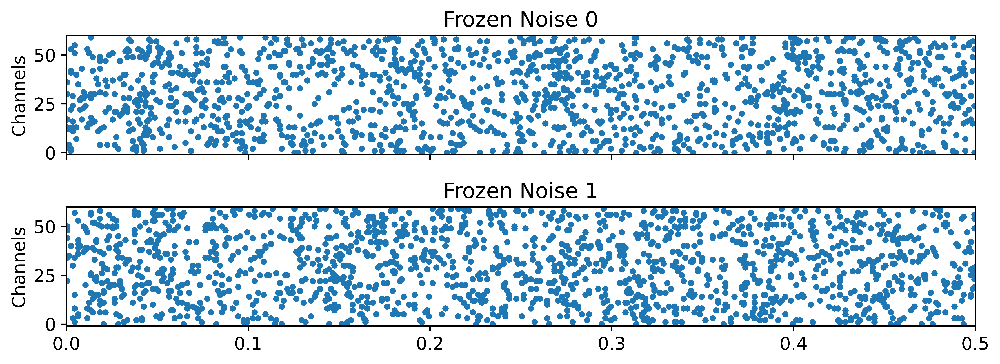

In [10]:
train_data.plot_samples()

### Step 2.2 : Run
Now let's run the model and compare the responses in terms of firing rate ratio.
The firing rate ratio (**FRR**) is the ratio between the superior and inferior mean firing rates read from the decision neurons.
FRR is calculated as follows:

$$
    FRR = \dfrac{r_{\text{superior}}}{r_{\text{inferior}}}
$$

If you have visited the last tutorial, you probably realized that the FRR readings are worse in this case, even though we have used the same trained weights.
You're right!

That's because we initiated the simulator with a mismatch parameter in this case and it deviated the network parameters a bit. It should be OK as long as it does not change the high level behaviour of the network. That is one neuron is firing at a clearly higher rate than the other. We'll face this issue using different chips as well.

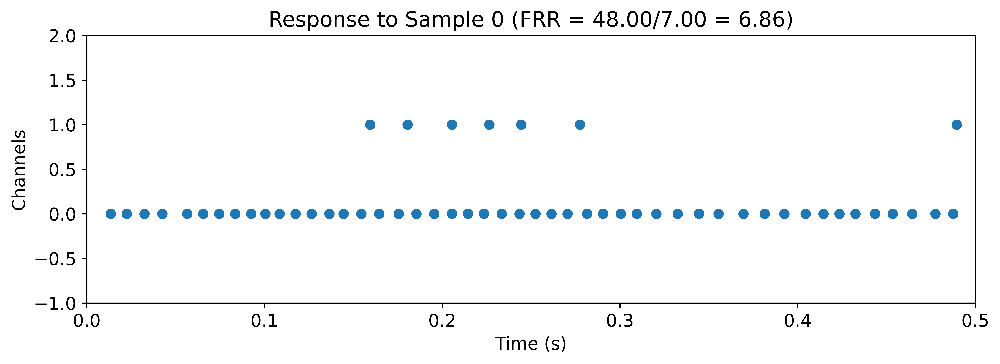

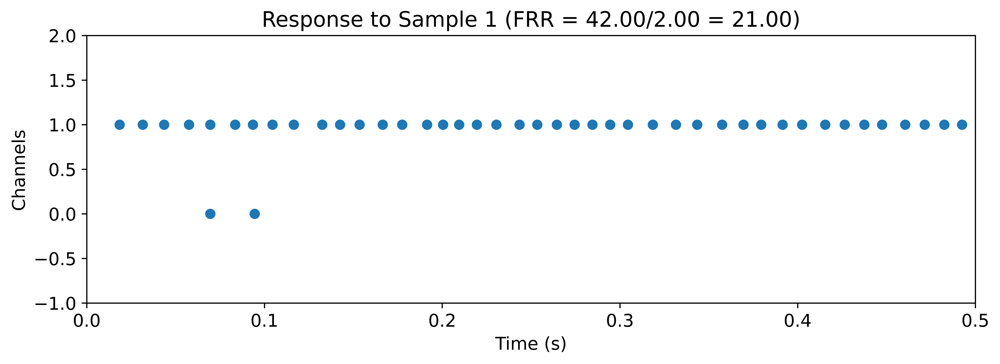

In [11]:
plot_model_response(net, train_data, dt)

It's seen that neuron 0 fires at a significantly higher rate than the neuron 1 given the frozen noise sample 0. For frozen noise 1, neuron 1 beats neuron 0. Let's check the test samples.

Histogram: 100 iteration [00:17,  5.85 iteration/s]               


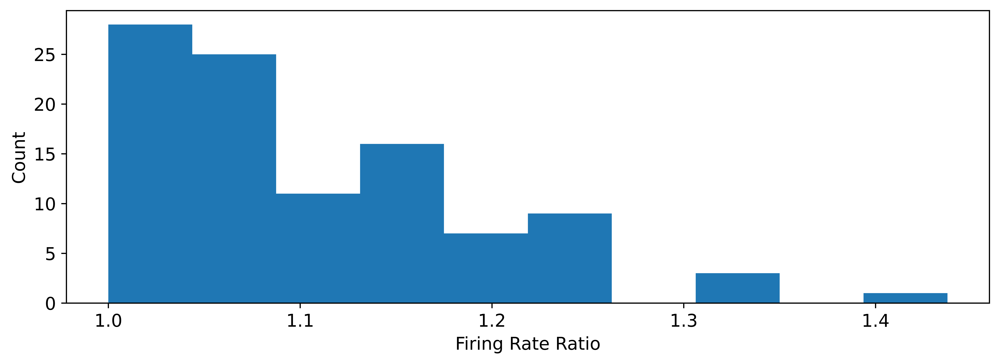

In [12]:
plot_model_response_histogram(net, test_data)

This histogram shows us that the firing rates between neurons are much more greater than 1 only in the case that the training sample 1 or the training sample 2 provided. In all other cases, the FRR is close to 1, meaning that the network does not express a clear decision on the 

## Step 3 : Extract the graph and Map

In this step, we extract the computational graph of the entire network and try to allocate hardware resources.
The chip has multiple cores that we can allocate neurons.
The mapper finds the most suitable cores for neurons depending on neurons' parameters.
Each neural core has a different parameter configuration.

In [13]:
spec = mapper(net.as_graph())

# The behavior of the circuit depends on the temprature. For now, just scale the Iscale parameter manually to make the network fire more or less.
# In future, we'll omit this!

spec["Iscale"] *= 50

## Step 4 : Quantize Weights

The weight matrices stored inside the layers are allowed to get any value in the simulation.
However, the hardware does not have a free-of-choice weight setting feature.
Only a 4-bit restricted connection-specific weight assignment is possible.
While deploying a network to Dynap-SE2, weight matrices can be converted to a device configuration through a quantization phase.

For Dynap-SE2, network weight configuration is a two-fold process.
4 base weight parameters define the basis of the inner product space.
Connection-specific digital memory cells store the 4-bit binary weight masks, producing the exact weight current that the synapse uses.

The object of quantization is to find a base weight current vector and a binary bit-mask matrix such that they together reconstruct the desired weight matrix with minimum deviation.
A popular unsupervised machine learning method, AutoEncoder structure, is used for this.
In this approach, intermediate code representation indicates the base weight currents, and the decoder weight matrix gives binary bit-masks.

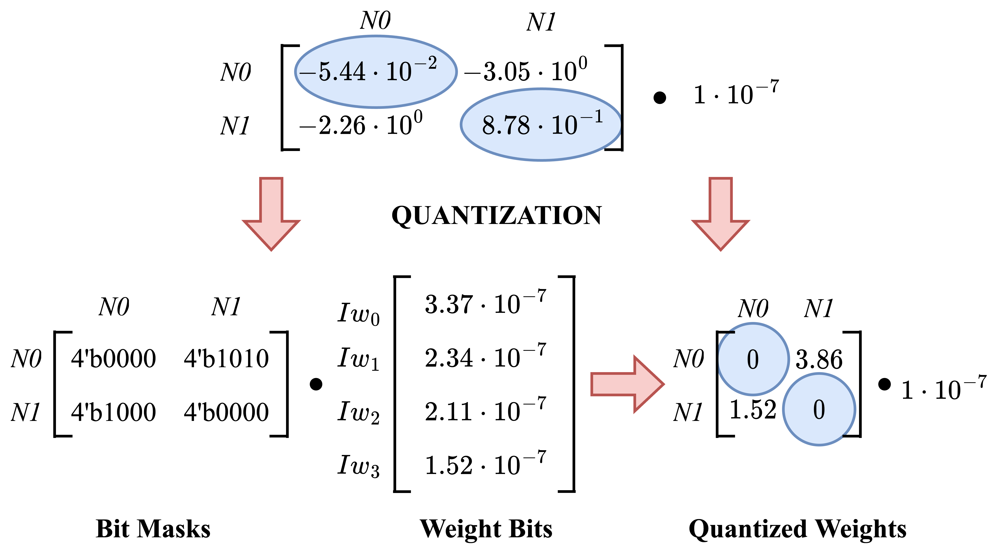

In [14]:
from IPython.display import Image
Image("images/weight_quantization.png", width=960)

The objective of the unsupervised AutoEncoder training is to find a hardware configuration that reproduces the target weight matrix with minimum deviation.
Mean square error approach is used to calculate the matrix reconstruction loss.
The reconstruction loss simply computes the difference between absolute values of the original weight matrix and the reconstructed version.
It takes the squares of differences of each cell and returns the mean value.

$$
    f_{MSE} (W_{Q}, W) = \dfrac{1}{N \cdot M} \sum_{i=0}^{N} \sum_{j=0}^{M} \| W_{Q}[i,j] - W[i,j] \|^{2}
$$

In [15]:
spec.update(autoencoder_quantization(**spec))

## Step 5 : Obtain Hardware Config

We now convert the network specification to a hardware configuration object.
This is fundementally a samna object that encapsulates the hardware configuration parameters.
The input channel map provides the mapping between input timeseries channels and the destinations which will helps us to map in further stages.

Deploying a network to the chip requires translating the neuron and synapse parameters and finding a network connectivity configuration.
The parameter translation means finding a bias generator setting that expresses the current values closely.
The current values used in the simulator are translated to coarse and fine values using bias generator lookup tables.
It requires finding the closest possible current value that the bias generator could provide with available coarse and fine values.

The optimized weight matrices refer to a connectivity configuration but could not be applied to the chip directly.
The quantization procedure finds the best possible base weight currents and weight masks reconstructing the weight matrices.
The weight masks are dispatched to digital memory blocks embedded in individual neural units.
The base weights are translated to coarse-fine values similar to other bias parameters.

The weight values are allowed to be negative or positive in the simulation.
However, the sign does not correspond to an actual attribute in the hardware.
The sign is accepted to represent the synapse's excitation or inhibition behavior and is used to determine the synapse type.
If the value is negative, the configuration pipeline chooses the inhibitory GABA synapse; if the value is positive, it sets up an excitatory AMPA synapse.
In this way, the negative and positive weights produce the desired effect on the post-synaptic membrane.

In [16]:
config = config_from_specification(**spec)


## Step 6 : Connect to Device

In [17]:
## Connect to device
se2_devices = find_dynapse_boards()

found_se2 = len(se2_devices) > 0

if not found_se2:
    raise IOError(
        "This tutorial requires a connected Dynap-SE2 Stack Board HDK to demonstrate."
    )
else:
    se2 = DynapseSamna(se2_devices[0], **config)


## Step 7 : Run the Simulation on Dynap-SE2

The network parameters and quantized weights are used to configure a hardware network on the Dynap-SE2 chip.
The frozen noise patterns are converted to real-time AER sequences.
Each event shown in the noise pattern is converted to a data package encapsulating the time and the address.
In this way, the time series can drive a real-time device emulation.

An on-board FPGA circuit converts AER events to digital pulses that stimulate the synaptic input gates of the neurons.
Analog neurons process the inputs and produce spikes correspondingly.
Whenever a neuron fires, digital circuits on FPGA senses the event and encapsulate the timestamp and the source address as an AER event.
These output AER events are temporarily stored in buffers implemented inside FPGA, waiting for real-time reading.
The output of the emulation is recorded as AER event sequences and visualized in a similar way that the other event sequences are visualized.

The figures show us that the network's response matches the simulated expectations.

<Figure size 11520x4320 with 0 Axes>

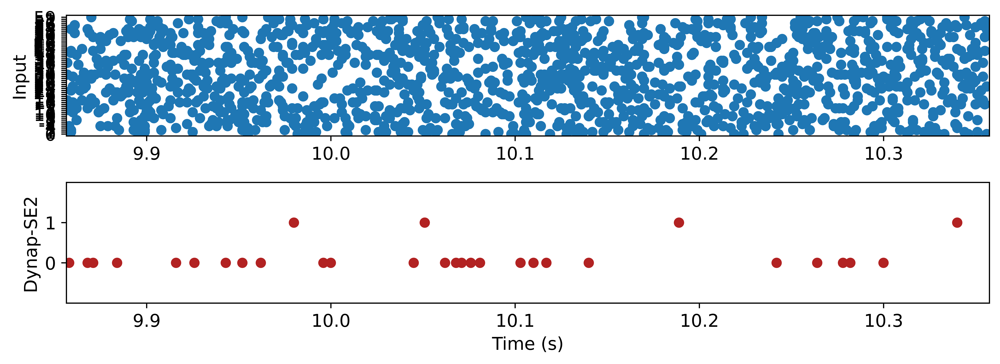

In [18]:
out, state, rec = se2(train_data[0][0], record=True)
visualize_device_sim(train_data[0][0], out, rec, config["input_channel_map"], se2.dt);

<Figure size 11520x4320 with 0 Axes>

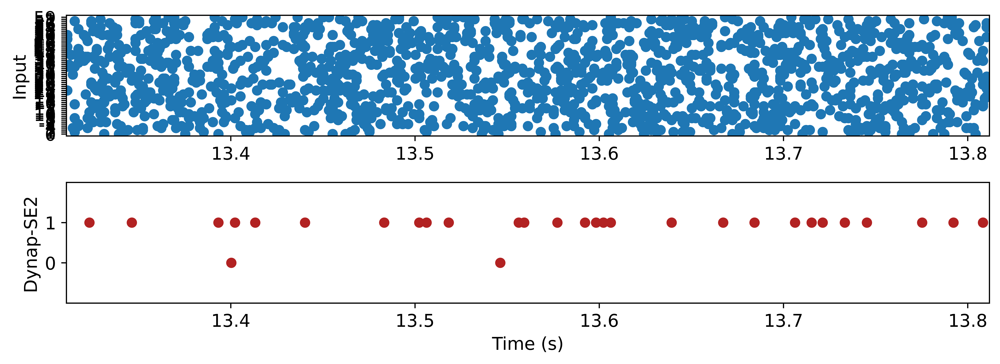

In [19]:
out, state, rec = se2(train_data[1][0], record=True)
visualize_device_sim(train_data[1][0], out, rec, config["input_channel_map"], se2.dt);

### Step 7.1 : Negative Tests

Let's feed the test data to the device and see that there is no significant difference between neurons' output firing patterns.

<Figure size 11520x4320 with 0 Axes>

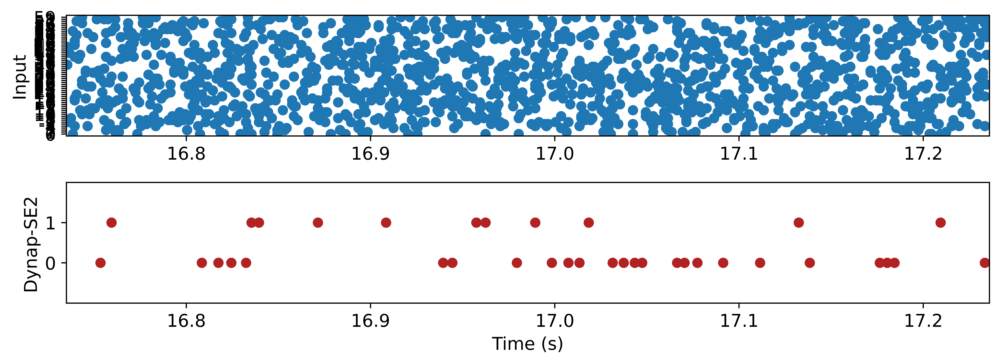

In [20]:
out, state, rec = se2(test_data[0][0], record=True)
visualize_device_sim(test_data[0][0], out, rec, config["input_channel_map"], se2.dt);

<Figure size 11520x4320 with 0 Axes>

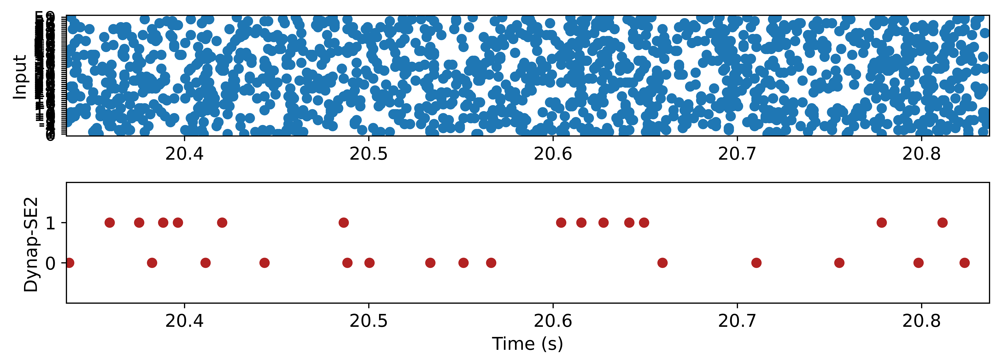

In [21]:
out, state, rec = se2(test_data[1][0], record=True)
visualize_device_sim(test_data[1][0], out, rec, config["input_channel_map"], se2.dt);

<Figure size 11520x4320 with 0 Axes>

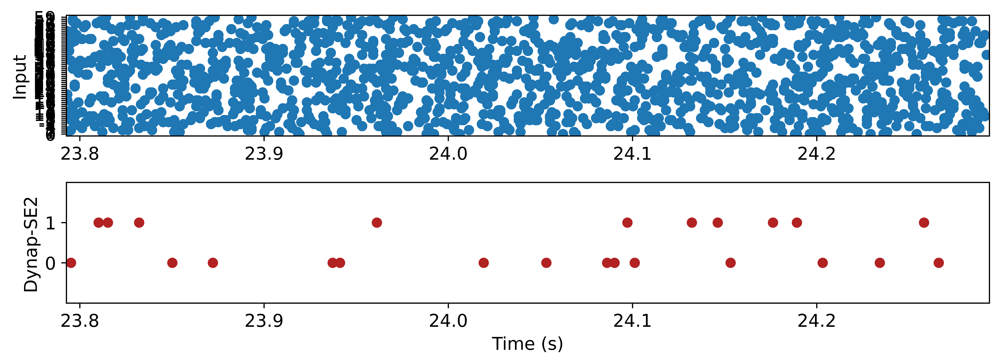

In [22]:
out, state, rec = se2(test_data[2][0], record=True)
visualize_device_sim(test_data[2][0], out, rec, config["input_channel_map"], se2.dt);

<Figure size 11520x4320 with 0 Axes>

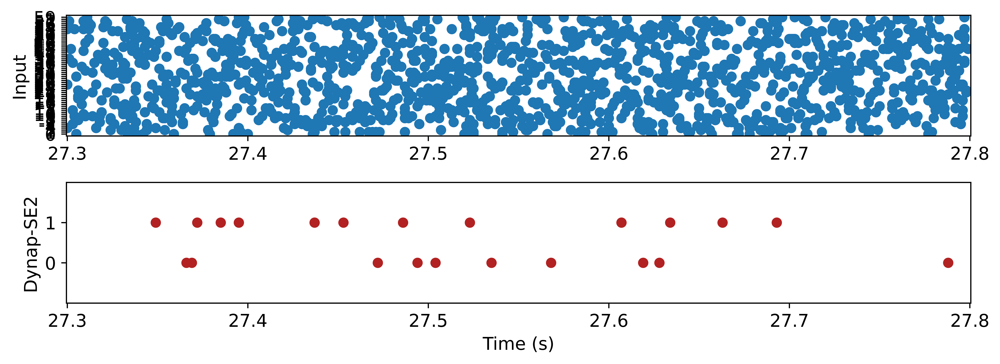

In [23]:
out, state, rec = se2(test_data[3][0], record=True)
visualize_device_sim(test_data[3][0], out, rec, config["input_channel_map"], se2.dt);

<Figure size 11520x4320 with 0 Axes>

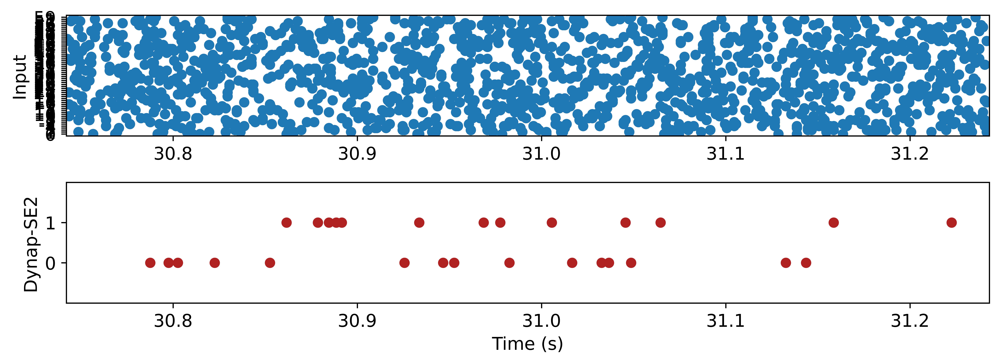

In [24]:
out, state, rec = se2(test_data[4][0], record=True)
visualize_device_sim(test_data[4][0], out, rec, config["input_channel_map"], se2.dt);

## Step 8 : Simulate the Quantized Network

It's also possible to reconstruct the simulator from a configuration object and run the simulation to observe the effects of the quantization and parameter translation. 
Steps here are no different than the simulating a rockpool network.

In [25]:
net_quantized = dynapsim_net_from_config(**config)

# Remember, we scaled the Iscale previously, now we should take this back!
net_quantized[1].Iscale /= 50

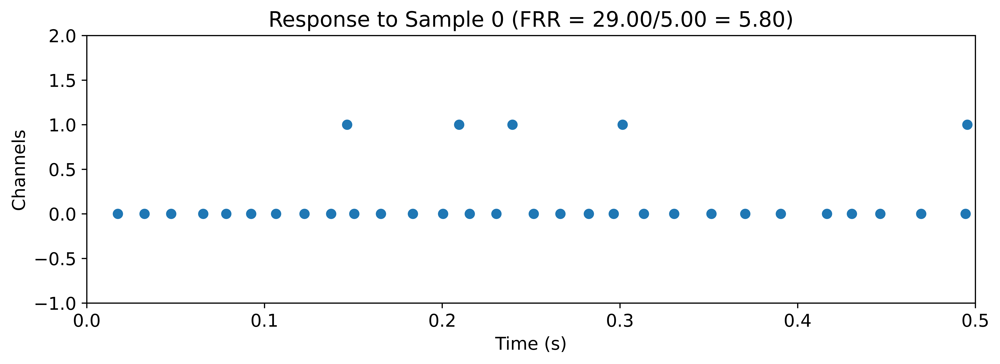

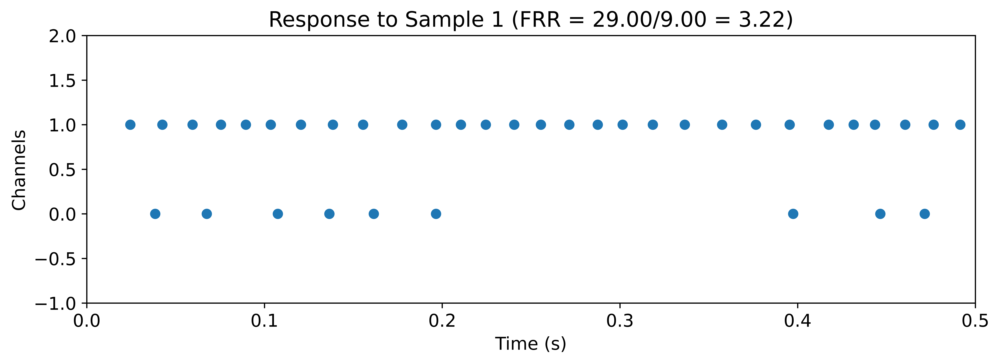

In [26]:
plot_model_response(net_quantized, train_data, dt)

Histogram: 100 iteration [00:17,  5.70 iteration/s]               


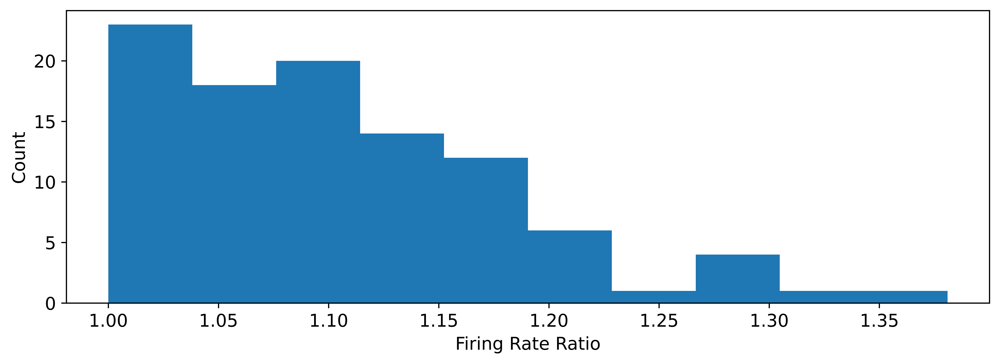

In [27]:
plot_model_response_histogram(net_quantized, test_data)